# Dependencies and files

## Install dependencies

## Imports

In [1]:
import warnings
import scanpy as sc
import anndata as an
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import os

sc.settings.set_figure_params(dpi=80)
#sc.set_figure_params(facecolor="white", figsize=(8, 8))
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 3

# Global variables

Нужно подключить свой гугл диск

In [2]:
de_dir_path = '../../../results/DE/mammals/ANOVA/'

In [4]:
os.makedirs('sample_data/heatmaps', exist_ok=True)
os.makedirs('sample_data/snakeplots', exist_ok=True)

In [5]:
os.listdir(de_dir_path)

['anova_mamm.csv',
 'anova_zscore_mamm.csv',
 'cluster_spectr_anova_6.csv',
 'cluster_spectr_anova_7.csv',
 'cluster_spectr_anova_8.csv',
 'cluster_spectr_anova_9.csv',
 'cluster_spectr_hs_6.csv',
 'cluster_spectr_hs_7.csv',
 'cluster_spectr_hs_8.csv',
 'cluster_spectr_hs_9.csv',
 'ttest_mamm.csv',
 'ttest_zscore_mamm.csv']

In [6]:
layers = ['WM', 'L1', 'L2', 'L3', 'L4', 'L5', "L6"]
cluster_color = ['red', 'blue', 'green',  'yellow', 'orange', 'purple', 'olive', 'pink', 'brown']
clusters_labels = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I']

### DE results

In [7]:
anova_res = pd.read_csv(de_dir_path + 'anova_mamm.csv', index_col=0)
anova_genes = anova_res[anova_res.p_val_adj < 0.05].index
anova_res.head()

,sum_sq,df,F,PR(>F),p_val_adj
NOC2L,0.050934,12.0,1.331623,2.198446e-01,2.964752e-01
HES4,0.047967,12.0,1.869576,5.257696e-02,9.164269e-02
AGRN,0.200630,12.0,3.592408,3.153396e-04,1.161898e-03
SDF4,0.014974,12.0,1.326877,2.223945e-01,2.993420e-01
B3GALT6,0.079358,12.0,6.536443,9.170559e-08,9.258330e-07


In [8]:
ttest_res = pd.read_csv(de_dir_path + 'ttest_mamm.csv', index_col=0)
ttest_res.head()

,gene,layer,group1,group2,score,pvalue,p_val_adj
0,AGRN,L1,human,chimp,0.205461,0.844006,0.927178
1,B3GALT6,L1,human,chimp,-1.994417,0.093144,0.309415
2,UBE2J2,L1,human,chimp,-1.303683,0.240125,0.497293
3,DVL1,L1,human,chimp,0.616069,0.560478,0.761871
4,ANKRD65,L1,human,chimp,-0.598616,0.571321,0.767981


## Load normalized pseudobulks

In [9]:
pb_dir_path = '../../../data/pseudobulks/'

In [10]:
os.listdir(pb_dir_path)

['annotation_chimp.csv',
 'annotation_human.csv',
 'annotation_macaque.csv',
 'annotation_spatial_libd_human.csv',
 'expression_chimp.csv',
 'expression_human.csv',
 'expression_macaque.csv',
 'expression_mean_chimp.csv',
 'expression_mean_human.csv',
 'expression_mean_macaque.csv',
 'expression_mean_spatial_libd_human.csv',
 'expression_spatial_libd_human.csv',
 'expression_sum_chimp.csv',
 'expression_sum_human.csv',
 'expression_sum_macaque.csv',
 'expression_sum_spatial_libd_human.csv',
 'gene_sample_mean_chimp.csv',
 'gene_sample_mean_human.csv',
 'gene_sample_mean_macaque.csv',
 'gene_sample_mean_spatial_libd_human.csv',
 'pb_age.h5ad',
 'pb_age_sample_norm.h5ad',
 'pb_age_sample_norm_zscore.h5ad',
 'pb_mamm.h5ad',
 'pb_mamm_sample_norm.h5ad',
 'pb_mamm_sample_norm_filtered.h5ad',
 'pb_mamm_sample_norm_zscore.h5ad',
 'pb_mamm_sample_zscore_filtered.h5ad']

In [11]:
adata_pb_norm = sc.read_h5ad(pb_dir_path + 'pb_mamm_sample_norm_filtered.h5ad')
adata_pb_norm.var = anova_res
adata_pb_norm

AnnData object with n_obs × n_vars = 94 × 9177
    obs: 'layer', 'sample_id', 'condition', 'lib_size', 'log_lib_size'
    var: 'sum_sq', 'df', 'F', 'PR(>F)', 'p_val_adj'
    uns: 'log1p', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

# Visualisation

## PCA

In [12]:
adata_norm_anova = adata_pb_norm[:, adata_pb_norm.var.p_val_adj < 0.05]
df = pd.DataFrame(adata_norm_anova.X, columns=adata_norm_anova.var_names, index=adata_norm_anova.obs_names)
df.head()

,AGRN,B3GALT6,UBE2J2,DVL1,ANKRD65,VWA1,TMEM240,SSU72,GNB1,TMEM52,...,PFKL,CFAP410,ADARB1,COL18A1,COL6A2,SPATC1L,LSS,DIP2A,S100B,PRMT2
WM.human_759,-0.043517,0.019739,0.073402,-0.059303,-0.017728,0.043856,-0.014294,-0.066947,-0.044555,-0.036660,...,-0.007565,-0.033007,-0.084815,0.058852,-0.030160,0.062820,0.006484,0.194320,-0.013049,0.086257
L5.human_759,0.081046,0.081751,0.024792,0.065203,-0.037591,0.018296,0.008752,0.040695,-0.005910,-0.017086,...,0.030875,-0.005560,0.123795,-0.092655,0.024885,0.031169,-0.011958,-0.003846,-0.163199,-0.036209
L2.human_759,-0.094585,-0.015252,-0.041863,0.044455,0.020012,-0.028660,-0.043676,-0.034586,0.058010,0.039615,...,-0.003073,0.021368,-0.034977,-0.010455,-0.067578,0.010243,-0.086682,-0.073351,-0.099099,0.033290
L3.human_759,0.055989,-0.030906,-0.005798,0.020492,0.045711,-0.016184,-0.026563,-0.003668,0.082764,0.001038,...,0.002126,0.042676,0.030607,-0.077531,-0.036660,-0.056161,-0.006626,-0.077773,-0.158475,-0.059096
L1.human_759,-0.060537,-0.022040,-0.051892,-0.046623,0.016406,-0.019107,-0.016515,-0.054316,-0.183437,-0.025866,...,-0.038251,-0.011802,-0.088431,0.269646,0.174653,-0.047335,0.132053,0.009784,0.679253,0.060213


In [13]:
human_specific_genes = ttest_res[(ttest_res.group1 == 'human') & (ttest_res.p_val_adj < 0.05)].gene.unique().tolist()
df_hs = df[human_specific_genes].copy()
df_hs.head()

,MFSD2A,ADAM15,BRINP3,PRKCE,GFPT1,ARID5A,RPRM,ABI2,NPPC,SYN2,...,ARFGAP1,SEMA6B,FBXL12,ANO8,SLC27A1,TMEM91,SLC25A1,UBE2L3,INPP5J,CYB5R3
WM.human_759,0.048485,-0.003354,-0.119692,0.071241,0.000189,-0.062529,0.125451,0.024234,0.050947,0.055021,...,-0.020264,-0.064117,0.000578,-0.069143,-0.094198,0.101537,0.021249,-0.011569,0.002014,-0.032007
L5.human_759,-0.055024,-0.069924,-0.123528,0.027574,0.002327,-0.032685,0.122501,-0.044866,-0.006239,0.084781,...,0.002783,0.027879,0.009896,-0.032966,-0.061143,0.014106,-0.008747,0.020083,0.021813,-0.057001
L2.human_759,0.011872,0.022202,0.142481,0.036119,-0.025017,0.070631,-0.164939,0.005079,-0.026086,-0.065579,...,-0.039030,-0.020872,0.017375,-0.052188,-0.011450,-0.018535,-0.009963,-0.112458,-0.037254,-0.040644
L3.human_759,-0.025095,-0.014187,0.215804,-0.004426,-0.020936,0.077599,-0.067135,0.053241,0.009740,-0.007895,...,0.006199,0.046286,0.001167,0.052611,-0.033126,-0.061774,0.021388,-0.022099,-0.049511,0.035452
L1.human_759,0.110264,0.031099,-0.152257,-0.214284,-0.079818,0.005449,-0.362849,-0.126554,0.017945,-0.270334,...,0.000490,0.050347,-0.015520,0.050656,0.159000,-0.044511,-0.014720,0.090160,-0.007131,0.122767


In [14]:
sample_order = dict()
for cond in ['human', 'chimp', 'macaque']:
    samples = df.loc[df.index.str.contains(cond)].index
    order = samples.sort_values()
    order_laminar = order[order.str.contains('L')].tolist()
    order_wm = order[order.str.contains('WM')].tolist()
    sample_order[cond] = order_wm + order_laminar
sample_order['all'] = sample_order['human'] + sample_order['chimp'] + sample_order['macaque']
df = df.loc[sample_order['all']]
df_hs = df_hs.loc[sample_order['all']]

In [15]:
import plotly.express as px
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
components = pca.fit_transform(adata_pb_norm.X.T)

In [16]:
fig = px.scatter(components, x=0, y=1, hover_name=adata_pb_norm.var_names, color=(adata_pb_norm.var.p_val_adj < 0.05))
fig.show('notebook')

# Clusterisation of the ANOVA significant genes

## Hierarchal clustering

D:\Projects\diploma\venv\lib\site-packages\seaborn\matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



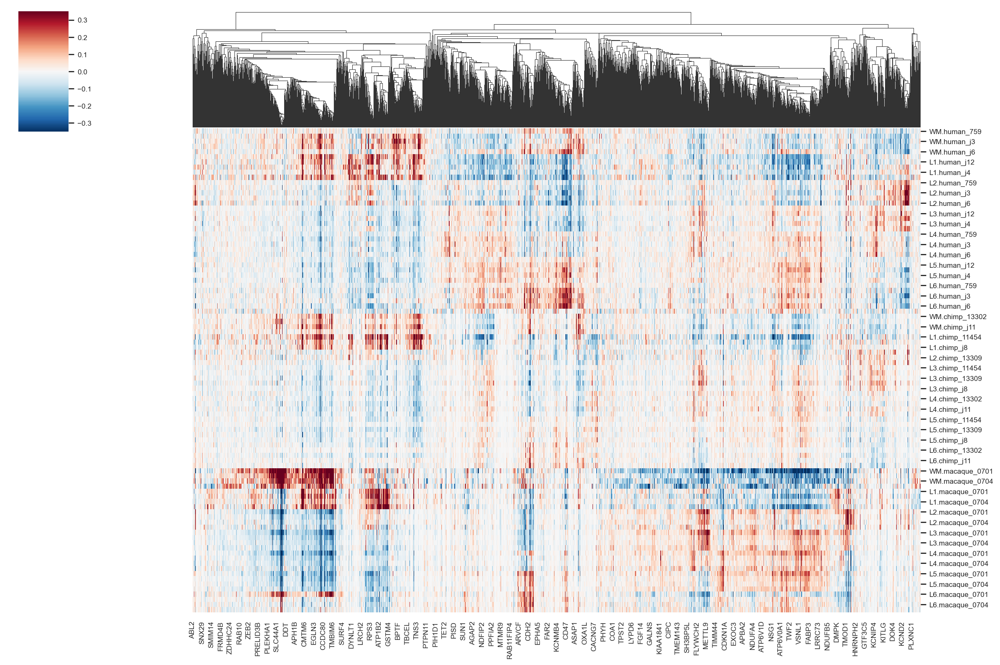

In [17]:
sns.set(font_scale=0.7)
sns.clustermap(df, figsize=(15, 10), cmap="RdBu_r", center=0, vmax=0.35, vmin=-0.35, metric='cosine', annot_kws={"size": 2}, row_cluster=False).savefig('sample_data/heatmaps/clustermap_anova.png')

Clusterization for each layer

D:\Projects\diploma\venv\lib\site-packages\seaborn\matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.

D:\Projects\diploma\venv\lib\site-packages\seaborn\matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.

D:\Projects\diploma\venv\lib\site-packages\seaborn\matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.

D:\Projects\diploma\venv\lib\site-packages\seaborn\matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.

D:\Projects\diploma\venv\lib\site-packages\seaborn\matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.

D:\Projects\diploma\venv\lib\site-packages\seaborn\matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may 

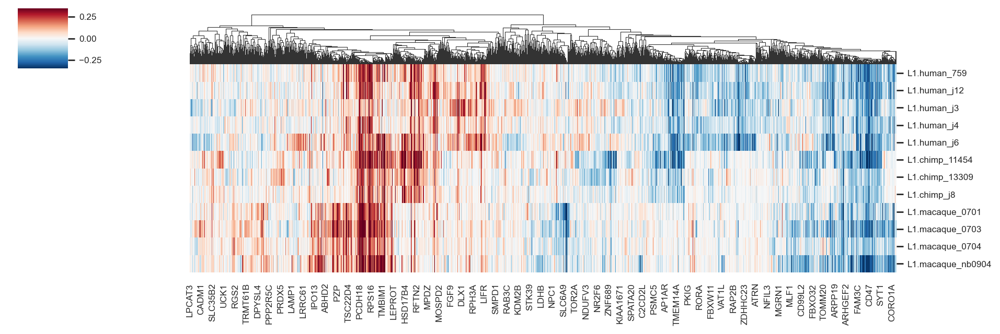

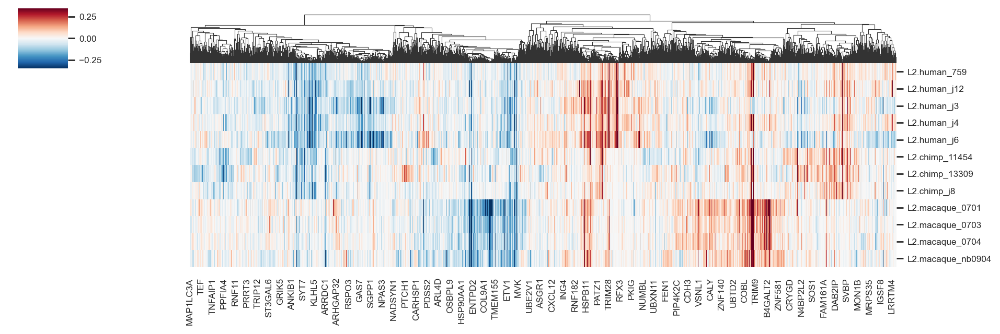

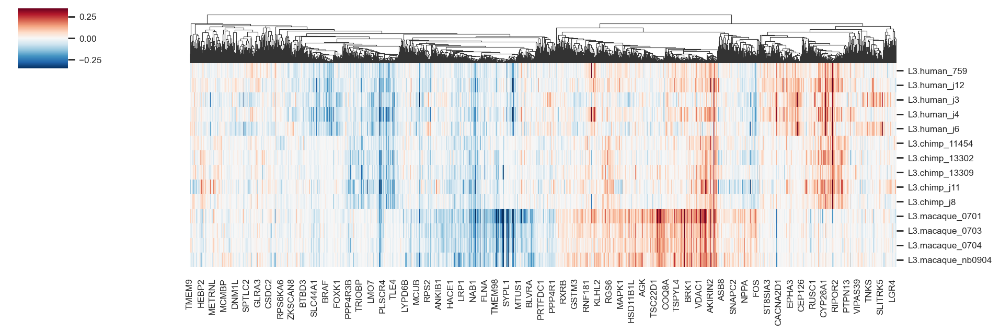

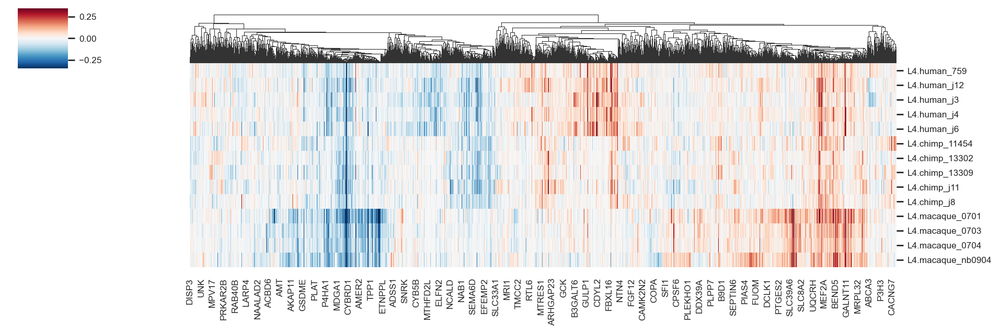

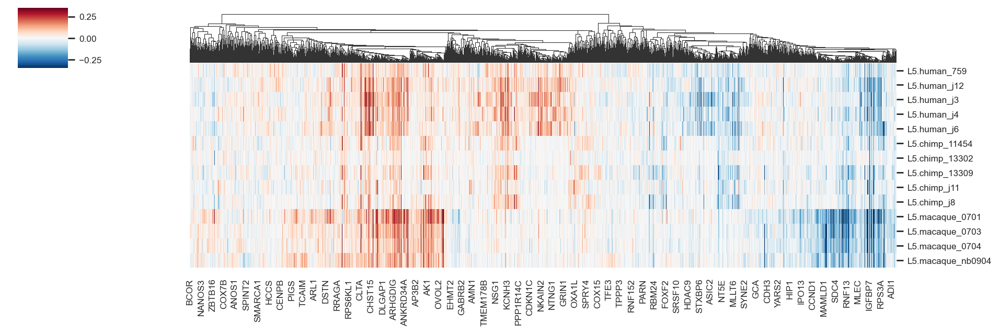

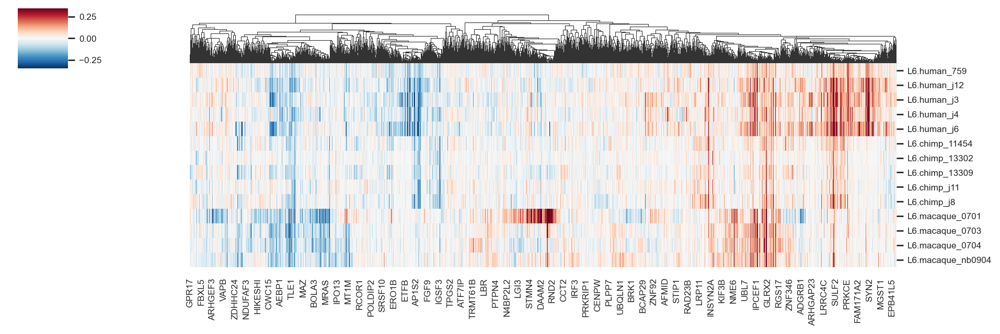

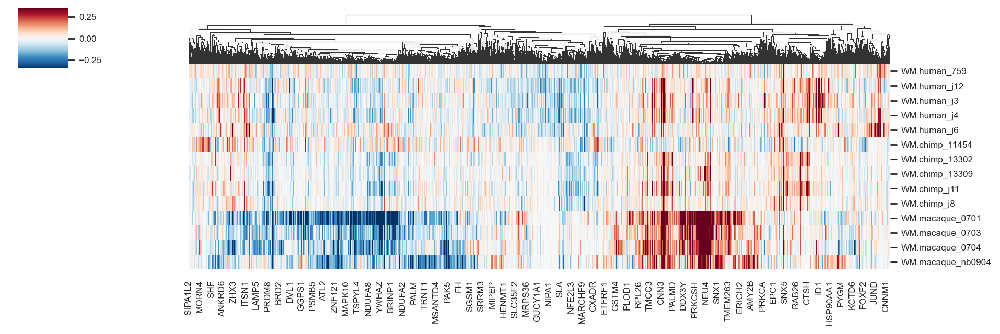

In [18]:
for layer in ['L1', 'L2', 'L3', 'L4', 'L5', 'L6', 'WM']:
    df_layer = df.loc[df.index.str.contains(layer)]
    sns.clustermap(df_layer, figsize=(12, 4), cmap="RdBu_r", center=0,
                   vmax=0.35, vmin=-0.35, metric='cosine',
                   annot_kws={"size": 2}, row_cluster=False)

Clusterisation for each specie

D:\Projects\diploma\venv\lib\site-packages\seaborn\matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.

D:\Projects\diploma\venv\lib\site-packages\seaborn\matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.

D:\Projects\diploma\venv\lib\site-packages\seaborn\matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



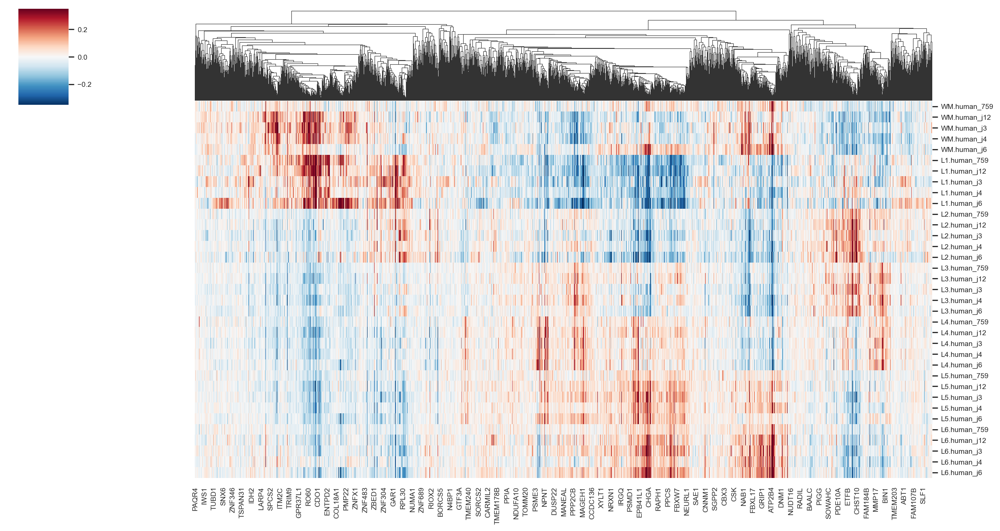

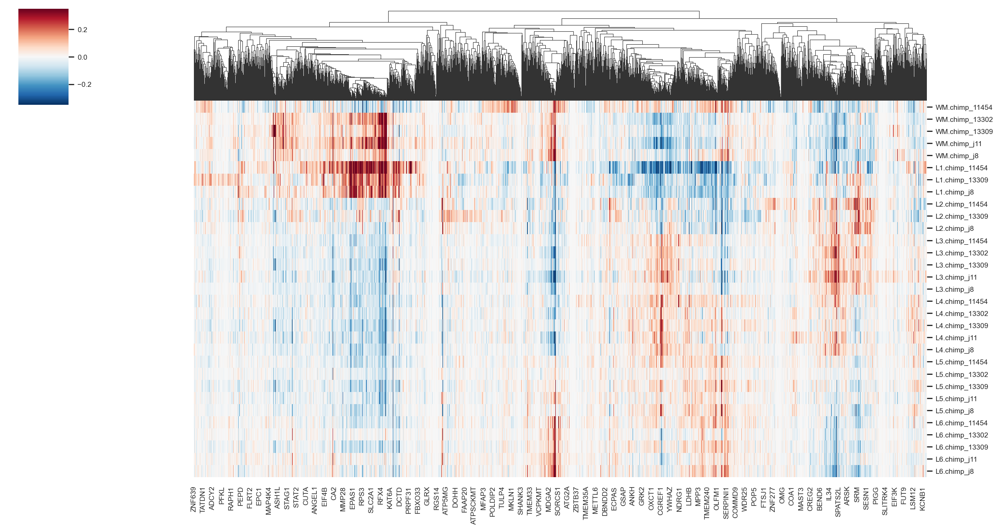

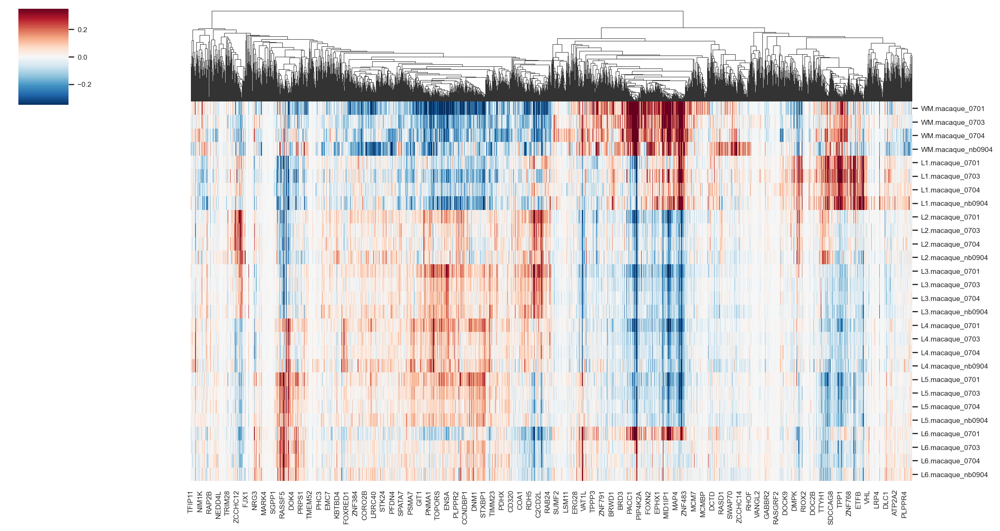

In [19]:
for cond in ['human', 'chimp', 'macaque']:
    df_cond = df.loc[df.index.str.contains(cond)]
    max_val = df_cond.max(axis=0).sort_values()
    df_cond = df_cond[max_val[max_val > 0].index.tolist()]
    sns.clustermap(df_cond, figsize=(15, 8), cmap="RdBu_r", center=0,
                   vmax=0.35, vmin=-0.35, metric='cosine',
                   annot_kws={"size": 2}, row_cluster=False)

## Spectral clustering

### 6 clusters

#### Clustering

In [42]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df.T, metric='cosine') + 1
n_clusters = 6
clustering = SpectralClustering(n_clusters=n_clusters, gamma=1, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)

SpectralClustering(affinity='precomputed', gamma=1, n_clusters=6,
                   random_state=4)

In [43]:
cl_order = {i: a for i, a in enumerate([1, 4, 3, 2, 0, 5])}
labels = pd.Series(clustering.labels_, index=df.columns).map(cl_order).sort_values()
order = labels.sort_values().index
#labels.to_csv(de_dir_path + f'cluster_spectr_anova_{n_clusters}.csv')

#### Heatmap

<Axes: >

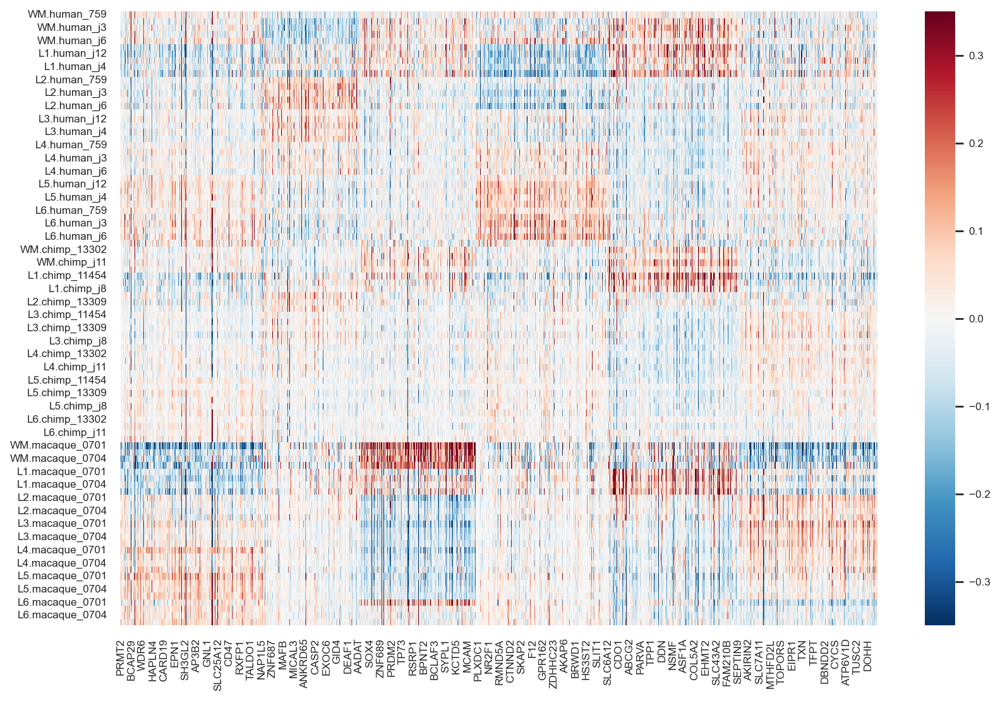

In [44]:
sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=0.35, vmin=-0.35, center=0)
#plt.savefig(f'sample_data/heatmaps/heatmap_spectr{n_clusters}_anova.png', bbox_inches='tight')

#### Heatmap for each layer

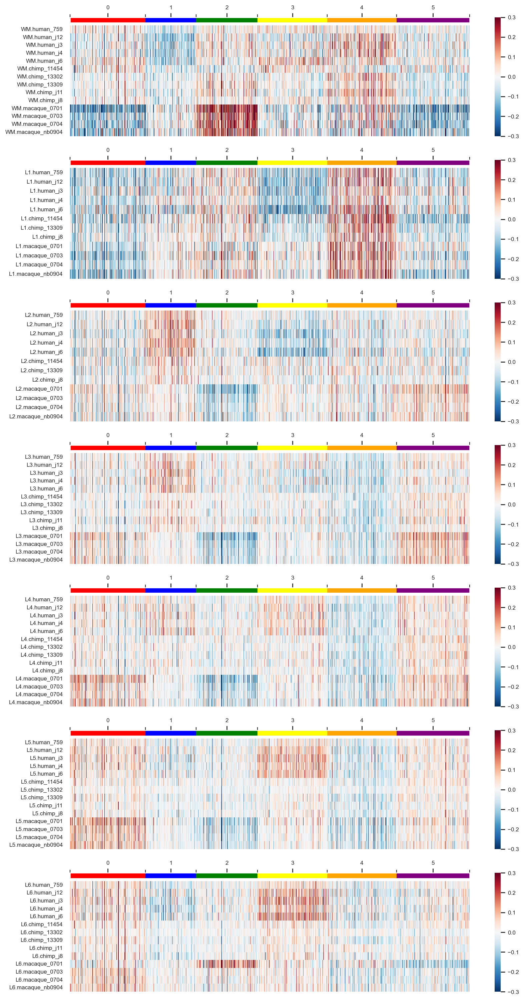

In [45]:
from matplotlib.patches import bbox_artist
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker

clusters = np.arange(n_clusters)
colors = cluster_color[:n_clusters]
fig, axes = plt.subplots(7, 1, figsize=(12, 4 * n_clusters), gridspec_kw={'hspace': 0.2})

for ax, layer in zip(axes.flatten(), ['WM', 'L1', 'L2', 'L3', 'L4', 'L5', 'L6']):
    df_layer = df.loc[df.index.str.contains(layer)]
    sns.heatmap(df_layer.loc[:, order], ax=ax, cmap="RdBu_r", vmax=0.3, vmin=-0.3, center=0, xticklabels=False)
    # colorbar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('top', size='5%', pad=0.05)
    cmap = mpl.colors.ListedColormap(colors)

    cluster_size = labels.value_counts().loc[clusters].values
    cluster_pos = cluster_size.cumsum()
    bounds = [0] + list(cluster_pos)
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
    fig.colorbar(
        mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
        cax=cax,
        ticks=bounds,
        orientation='horizontal',
        spacing='proportional'
    )
    cax.xaxis.set_major_locator(ticker.FixedLocator(cluster_pos - cluster_size / 2))
    cax.xaxis.set_major_formatter(ticker.FixedFormatter(clusters))
    cax.xaxis.tick_top()

#### Snakeplot for each layer

In [46]:
df_annotation = df.copy()
df_annotation['layer'] = adata_norm_anova.obs.layer
df_annotation['condition'] = adata_norm_anova.obs.condition

In [47]:
layer_mean = df_annotation.groupby(['condition', 'layer']).mean()
layer_mean.head()

AGRN   B3GALT6    UBE2J2      DVL1   ANKRD65      VWA1   
condition layer                                                               
chimp     L1    -0.119524 -0.000567  0.032052  0.008976  0.000000  0.151797  \
          L2    -0.099259 -0.000567 -0.050709  0.002362  0.000000  0.067493   
          L3     0.019125  0.001327  0.002956 -0.003721 -0.000191 -0.056693   
          L4     0.053712 -0.000785  0.027191 -0.002562 -0.000191 -0.063340   
          L5     0.026202  0.000751 -0.017042 -0.000556 -0.000191 -0.033304   

                  TMEM240     SSU72      GNB1    TMEM52  ...      PFKL   
condition layer                                          ...             
chimp     L1    -0.190879 -0.039472 -0.129260  0.005402  ...  0.052275  \
          L2    -0.014270  0.001501  0.071781  0.003327  ...  0.001458   
          L3    -0.003764  0.000646  0.079202  0.032573  ... -0.016063   
          L4     0.029048  0.001276  0.064725  0.010513  ... -0.005136   
          L5     0.037691  0.010823  0.015068 -0.007878  ... -0.011721   

                  CFAP410    ADARB1   COL18A1    COL6A2   SPATC1L       LSS   
condition layer                                                               
chimp     L1    -0.001894  0.001726  0.489758 -0.002255  0.046419 -0.000150  \
          L2     0.005423  0.000949 -0.024082 -0.002255 -0.030134 -0.000150   
          L3     0.004769  0.006501 -0.028237 -0.001544  0.002260  0.004245   
          L4     0.013968 -0.007258 -0.067542 -0.001544 -0.007170 -0.001255   
          L5    -0.003640  0.005254 -0.044087 -0.001544  0.025810 -0.001255   

                    DIP2A     S100B     PRMT2  
condition layer                                
chimp     L1    -0.074993  0.664400 -0.043875  
          L2    -0.018350 -0.109731  0.033933  
          L3    -0.107366 -0.181534 -0.092685  
          L4    -0.103520 -0.211584 -0.008325  
          L5     0.034859 -0.201920 -0.000752  

[5 rows x 4680 columns]

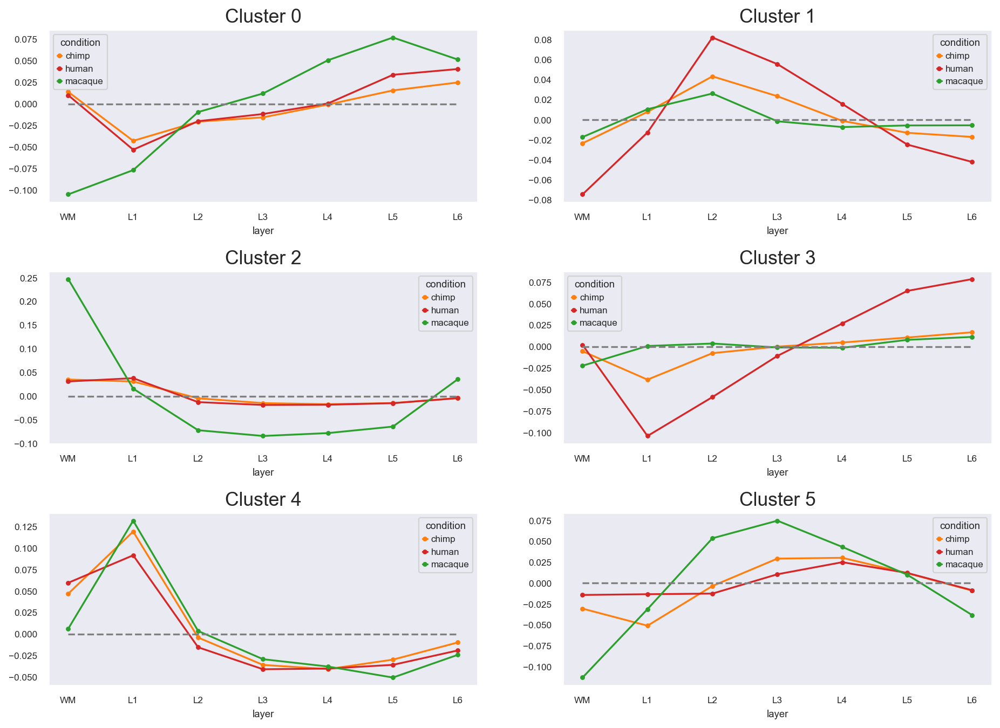

In [48]:
fig, axes = plt.subplots(n_clusters // 2, 2,  figsize=(14, 3.5 * n_clusters // 2), gridspec_kw={'hspace': 0.4})

for label, ax in zip(clusters, axes.flatten()):
    genes = labels[labels == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')

### 7 clusters

#### Clustering

In [49]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df.T, metric='cosine') + 1
n_clusters = 7
clustering = SpectralClustering(n_clusters=n_clusters, gamma=1, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)

SpectralClustering(affinity='precomputed', gamma=1, n_clusters=7,
                   random_state=4)

In [50]:
cl_order = {i: a for i, a in enumerate([3, 1, 4, 0, 2, 6, 5])}
labels = pd.Series(clustering.labels_, index=df.columns).map(cl_order).sort_values()
order = labels.sort_values().index
#labels.to_csv(de_dir_path + f'cluster_spectr_anova_{n_clusters}.csv')

#### Heatmap

<Axes: >

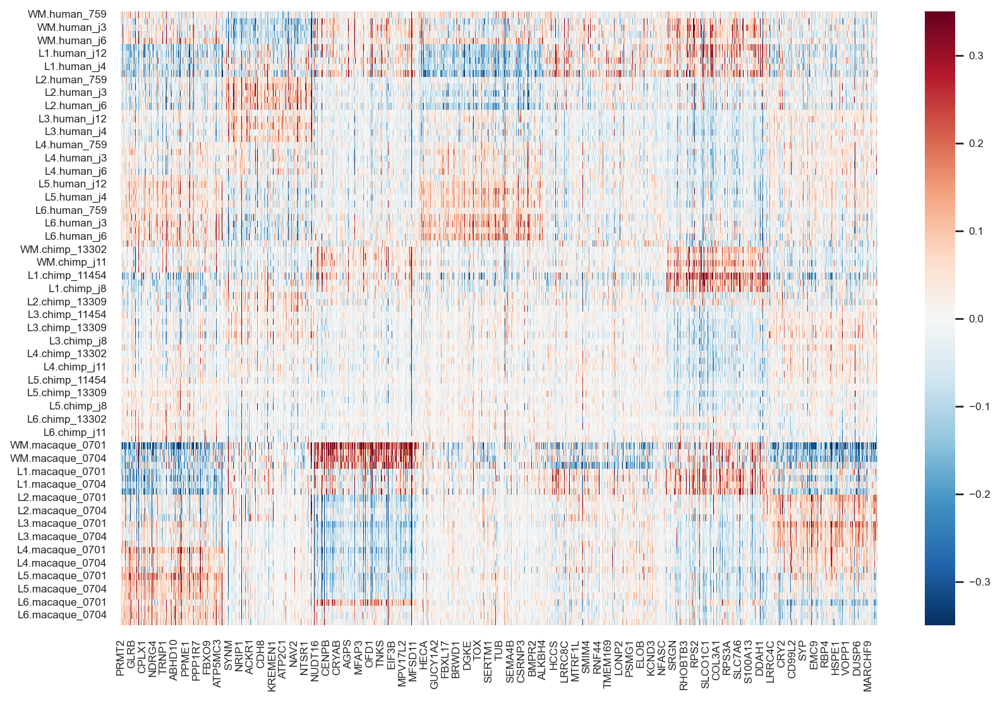

In [51]:
sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=0.35, vmin=-0.35, center=0)
#plt.savefig(f'sample_data/heatmaps/heatmap_spectr{n_clusters}_anova.png', bbox_inches='tight')

#### Heatmap for each layer

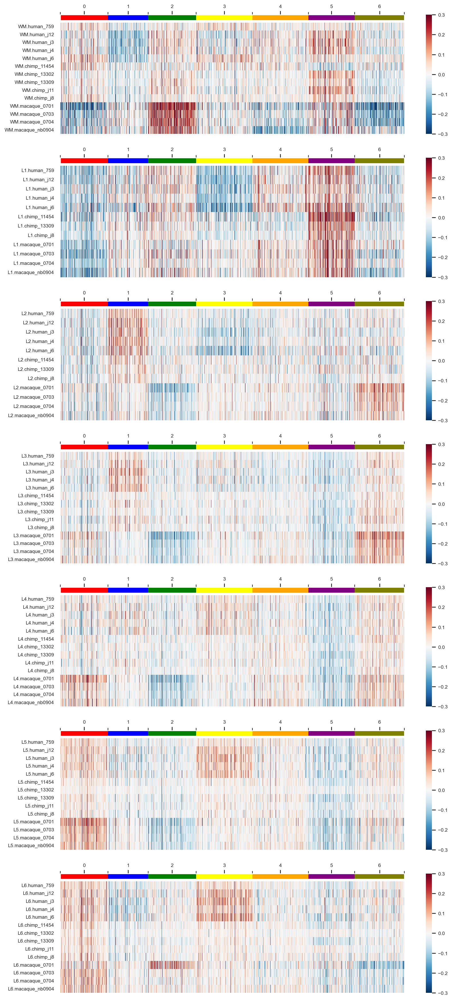

In [52]:
from matplotlib.patches import bbox_artist
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker

clusters = np.arange(n_clusters)
colors = cluster_color[:n_clusters]
fig, axes = plt.subplots(7, 1, figsize=(12, 4 * n_clusters), gridspec_kw={'hspace': 0.2})

for ax, layer in zip(axes.flatten(), ['WM', 'L1', 'L2', 'L3', 'L4', 'L5', 'L6']):
    df_layer = df.loc[df.index.str.contains(layer)]
    sns.heatmap(df_layer.loc[:, order], ax=ax, cmap="RdBu_r", vmax=0.3, vmin=-0.3, center=0, xticklabels=False)
    # colorbar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('top', size='5%', pad=0.05)
    cmap = mpl.colors.ListedColormap(colors)

    cluster_size = labels.value_counts().loc[clusters].values
    cluster_pos = cluster_size.cumsum()
    bounds = [0] + list(cluster_pos)
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
    fig.colorbar(
        mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
        cax=cax,
        ticks=bounds,
        orientation='horizontal',
        spacing='proportional'
    )
    cax.xaxis.set_major_locator(ticker.FixedLocator(cluster_pos - cluster_size / 2))
    cax.xaxis.set_major_formatter(ticker.FixedFormatter(clusters))
    cax.xaxis.tick_top()

#### Snakeplot for each layer

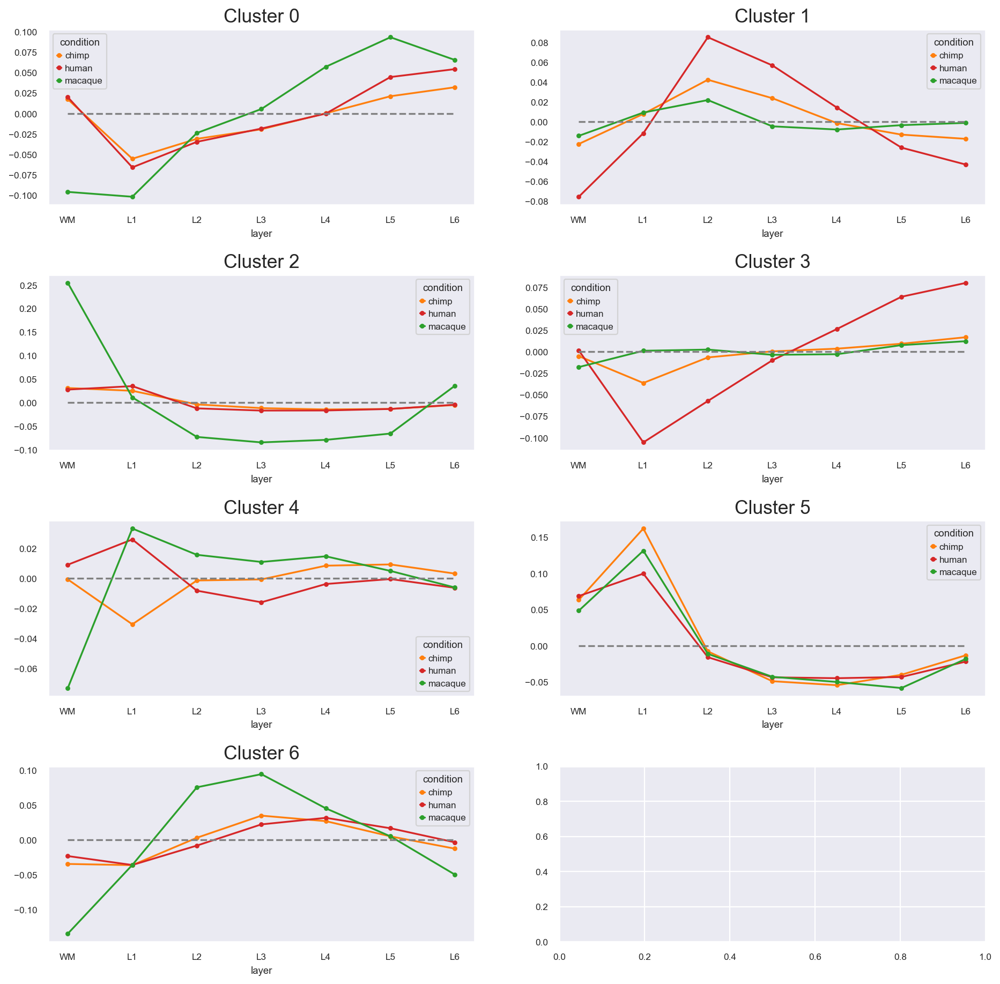

In [53]:
n_rows = (n_clusters // 2 + n_clusters % 2)
fig, axes = plt.subplots(n_rows, 2,  figsize=(14, 3.5 * n_rows), gridspec_kw={'hspace': 0.4})

for label, ax in zip(clusters, axes.flatten()):
    genes = labels[labels == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')

### 8 clusters

#### Clustering

In [54]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df.T, metric='cosine') + 1
n_clusters = 8
clustering = SpectralClustering(n_clusters=n_clusters, gamma=1, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)

SpectralClustering(affinity='precomputed', gamma=1, random_state=4)

In [55]:
cl_order = {i: a for i, a in enumerate([7, 5, 2, 4, 1, 0, 6, 3])}
labels = pd.Series(clustering.labels_, index=df.columns).map(cl_order).sort_values()
order = labels.sort_values().index
#labels.to_csv(de_dir_path + f'cluster_spectr_anova_{n_clusters}.csv')

#### Heatmap

<Axes: >

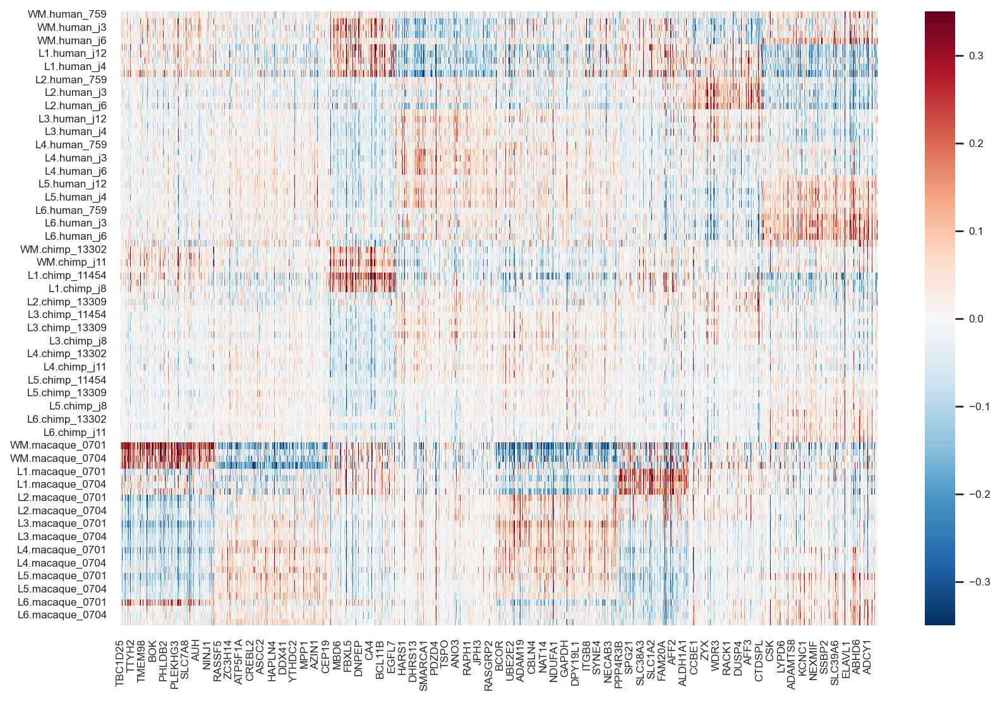

In [56]:
sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=0.35, vmin=-0.35, center=0)
#plt.savefig(f'sample_data/heatmaps/heatmap_spectr{n_clusters}_anova.png', bbox_inches='tight')

#### Heatmap for each layer

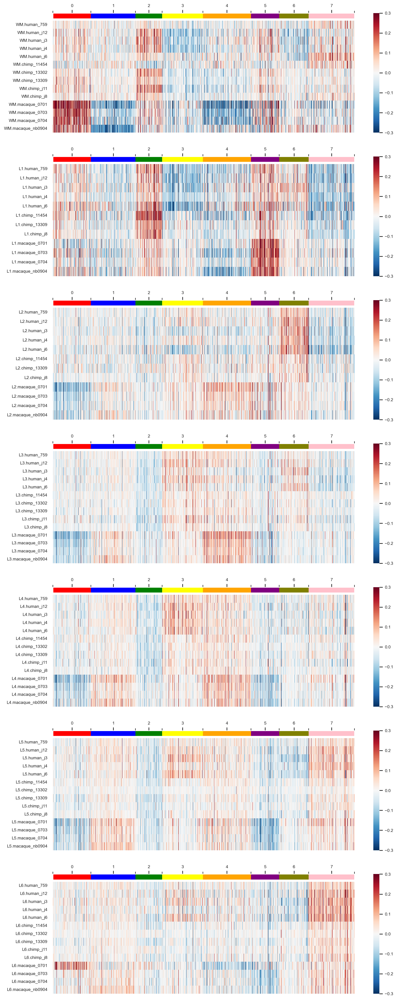

In [57]:
from matplotlib.patches import bbox_artist
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker

clusters = np.arange(n_clusters)
colors = cluster_color[:n_clusters]
fig, axes = plt.subplots(7, 1, figsize=(12, 4 * n_clusters), gridspec_kw={'hspace': 0.2})

for ax, layer in zip(axes.flatten(), ['WM', 'L1', 'L2', 'L3', 'L4', 'L5', 'L6']):
    df_layer = df.loc[df.index.str.contains(layer)]
    sns.heatmap(df_layer.loc[:, order], ax=ax, cmap="RdBu_r", vmax=0.3, vmin=-0.3, center=0, xticklabels=False)
    # colorbar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('top', size='5%', pad=0.05)
    cmap = mpl.colors.ListedColormap(colors)

    cluster_size = labels.value_counts().loc[clusters].values
    cluster_pos = cluster_size.cumsum()
    bounds = [0] + list(cluster_pos)
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
    fig.colorbar(
        mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
        cax=cax,
        ticks=bounds,
        orientation='horizontal',
        spacing='proportional'
    )
    cax.xaxis.set_major_locator(ticker.FixedLocator(cluster_pos - cluster_size / 2))
    cax.xaxis.set_major_formatter(ticker.FixedFormatter(clusters))
    cax.xaxis.tick_top()

#### Snakeplot for each layer

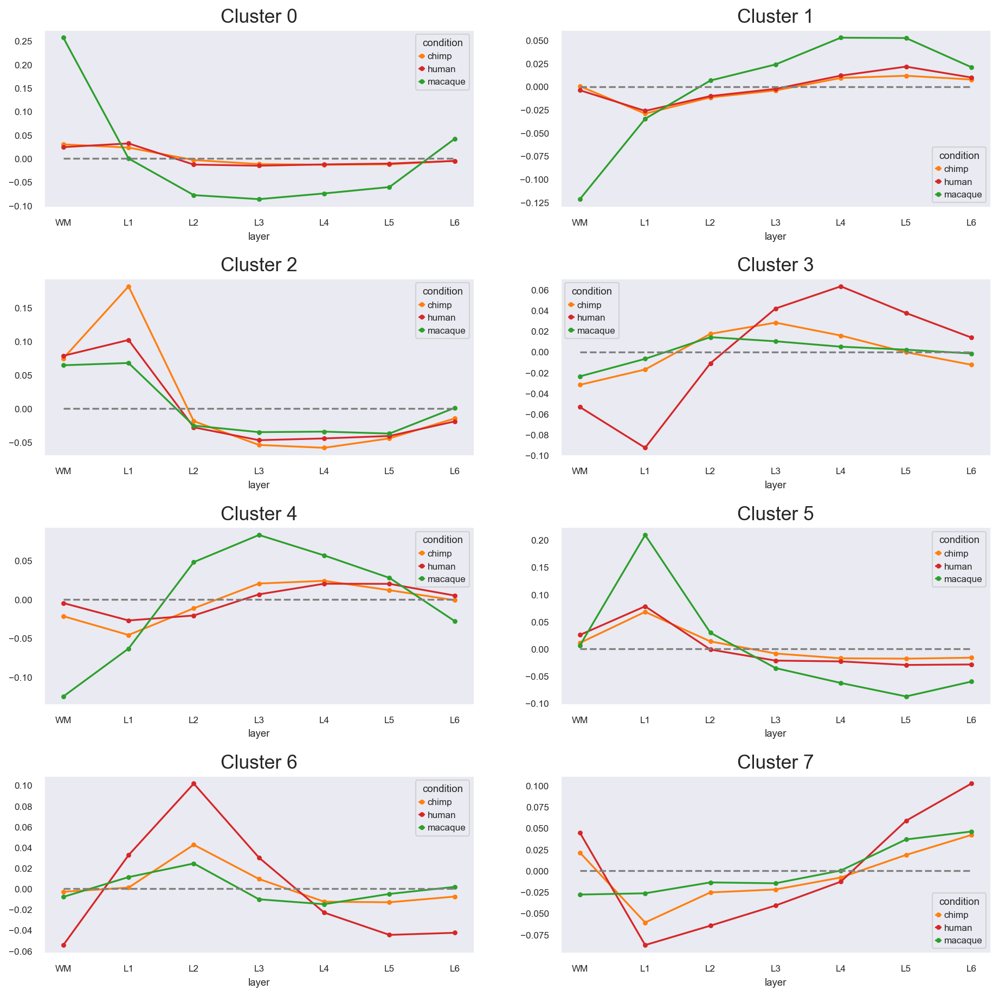

In [58]:
n_rows = (n_clusters // 2 + n_clusters % 2)
fig, axes = plt.subplots(n_rows, 2,  figsize=(14, 3.5 * n_rows), gridspec_kw={'hspace': 0.4})

for label, ax in zip(clusters, axes.flatten()):
    genes = labels[labels == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')

### 9 clusters

#### Clustering

In [59]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df.T, metric='cosine') + 1
n_clusters = 9
clustering = SpectralClustering(n_clusters=n_clusters, gamma=1, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)

SpectralClustering(affinity='precomputed', gamma=1, n_clusters=9,
                   random_state=4)

In [60]:
cl_order = {i: a for i, a in enumerate([3, 5, 8, 0, 2, 6, 1, 7, 4])}
labels = pd.Series(clustering.labels_, index=df.columns).map(cl_order).sort_values()
order = labels.sort_values().index
#labels.to_csv(de_dir_path + f'cluster_spectr_anova_{n_clusters}.csv')

#### Heatmap

<Axes: >

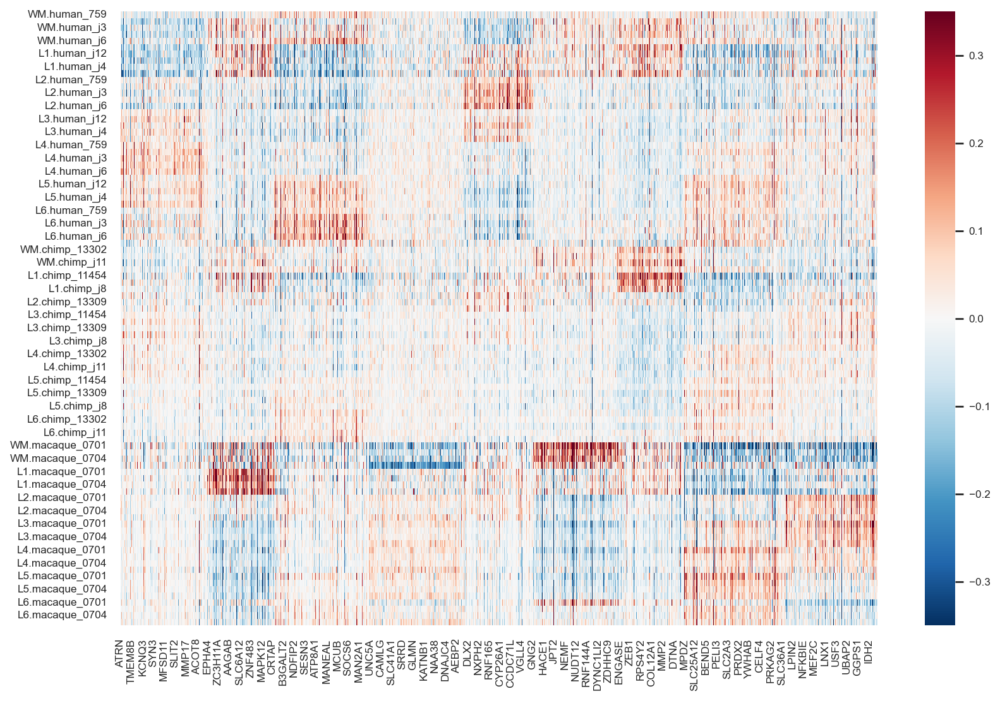

In [61]:
sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=0.35, vmin=-0.35, center=0)
#plt.savefig(f'sample_data/heatmaps/heatmap_spectr{n_clusters}_anova.png', bbox_inches='tight')

#### Heatmap for each layer

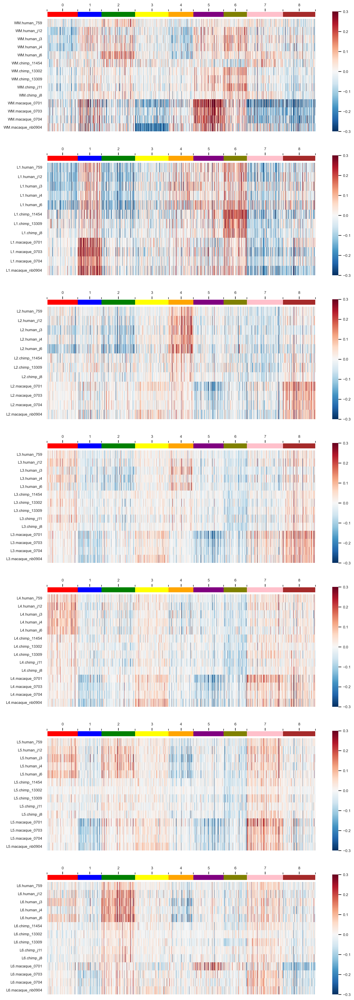

In [62]:
from matplotlib.patches import bbox_artist
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker

clusters = np.arange(n_clusters)
colors = cluster_color[:n_clusters]
fig, axes = plt.subplots(7, 1, figsize=(12, 4 * n_clusters), gridspec_kw={'hspace': 0.2})

for ax, layer in zip(axes.flatten(), ['WM', 'L1', 'L2', 'L3', 'L4', 'L5', 'L6']):
    df_layer = df.loc[df.index.str.contains(layer)]
    sns.heatmap(df_layer.loc[:, order], ax=ax, cmap="RdBu_r", vmax=0.3, vmin=-0.3, center=0, xticklabels=False)
    # colorbar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('top', size='5%', pad=0.05)
    cmap = mpl.colors.ListedColormap(colors)

    cluster_size = labels.value_counts().loc[clusters].values
    cluster_pos = cluster_size.cumsum()
    bounds = [0] + list(cluster_pos)
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
    fig.colorbar(
        mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
        cax=cax,
        ticks=bounds,
        orientation='horizontal',
        spacing='proportional'
    )
    cax.xaxis.set_major_locator(ticker.FixedLocator(cluster_pos - cluster_size / 2))
    cax.xaxis.set_major_formatter(ticker.FixedFormatter(clusters))
    cax.xaxis.tick_top()

#### Snakeplot for each layer

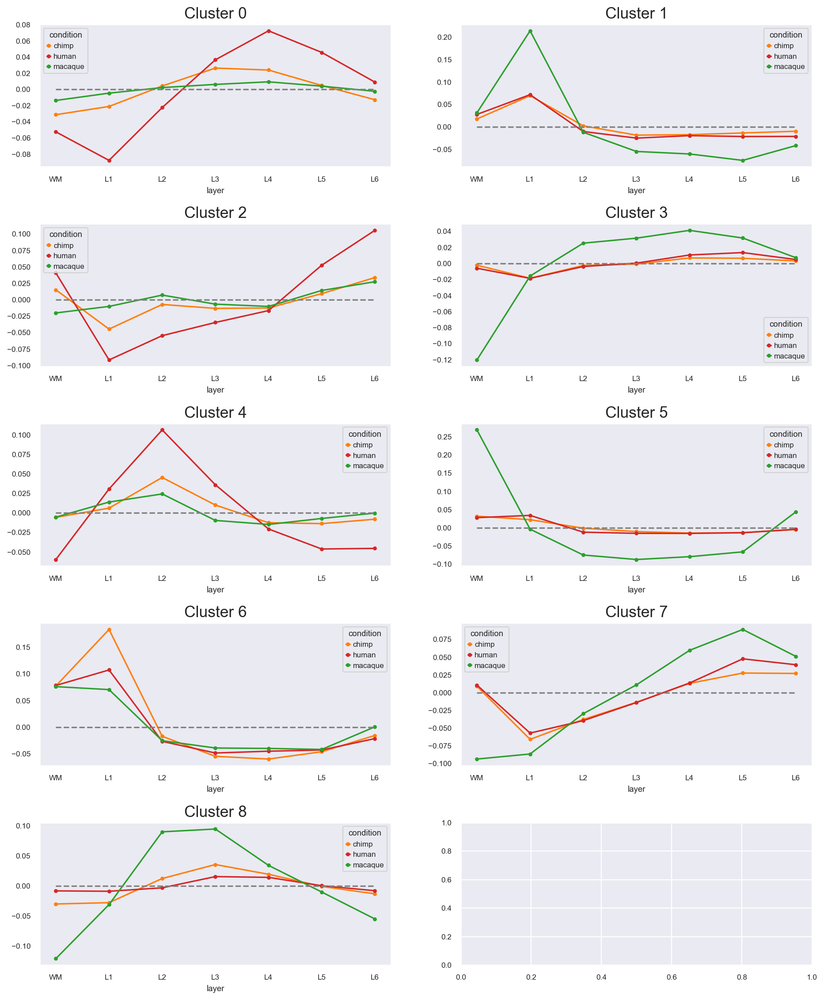

In [63]:
n_rows = (n_clusters // 2 + n_clusters % 2)
fig, axes = plt.subplots(n_rows, 2,  figsize=(14, 3.5 * n_rows), gridspec_kw={'hspace': 0.4})

for label, ax in zip(clusters, axes.flatten()):
    genes = labels[labels == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')